In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#all Kaggle datasets used from March Madness Mania notebook: 
# https://www.kaggle.com/competitions/march-machine-learning-mania-2023/data
regSsn = pd.read_csv('../data/MRegularSeasonDetailedResults.csv')
seeds = pd.read_csv('../data/MNCAATourneySeeds.csv')
conferences = pd.read_csv('../data/MTeamConferences.csv')
tournResults = pd.read_csv('../data/MNCAATourneyCompactResults.csv')
masseyRnkgs = pd.read_csv('../data/MMasseyOrdinals_thru_Season2023_Day128.csv')

In [3]:
# FEATURE ENGINEERING:
#function takes in the regular season detailed boxscores dataframe
# and makes a new dataframe that holds the total statistics for each team in each season 
# (i.e. points scored, total assists) and the total games played

def makeTeamSeasonStats(df):
    df['WTeamPPG'] = df['WScore'] / 1  # Assuming 1 game played
    df['LTeamPPG'] = df['LScore'] / 1  
    df['WTeamAPG'] = df['WAst'] / 1  
    df['LTeamAPG'] = df['LAst'] / 1  
    df['WTeamORPG'] = df['WOR'] / 1  
    df['LTeamORPG'] = df['LOR'] / 1  
    df['WTeamDRPG'] = df['WDR'] / 1
    df['LTeamDRPG'] = df['LDR'] / 1
    df['WTeamFGA'] = df['WFGA'] / 1
    df['LTeamFGA'] = df['LFGA'] / 1
    df['WTeamFGM'] = df['WFGM'] / 1
    df['LTeamFGM'] = df['LFGM'] / 1
    df['WTeamStl'] = df['WStl'] / 1
    df['LTeamStl'] = df['LStl'] / 1
    df['WTeamBlk'] = df['WBlk'] / 1
    df['LTeamBlk'] = df['LBlk'] / 1
    df['WTeamTO'] = df['WTO'] / 1
    df['LTeamTO'] = df['LTO'] / 1
    df['WTeamFouls'] = df['WPF'] / 1
    df['LTeamFouls'] = df['LPF'] / 1
    df['WTeamFGA3'] = df['WFGA3'] / 1
    df['LTeamFGA3'] = df['LFGA3'] / 1
    df['WTeamFGM3'] = df['WFGM3'] / 1
    df['LTeamFGM3'] = df['LFGM3'] / 1
    df['WTeamFTA'] = df['WFTA'] / 1
    df['LTeamFTA'] = df['LFTA'] / 1
    df['WTeamFTM'] = df['WFTM'] / 1
    df['LTeamFTM'] = df['LFTM'] / 1
    winning_team_stats = df.groupby(['Season', 'WTeamID']).agg(
    {'WScore': 'sum', 'LScore':'sum','WAst': 'sum', 'WOR': 'sum','LOR': 'sum','WDR':'sum','WFGA':'sum','LFGA':'sum','WFGM':'sum',
     'WStl':'sum','WBlk':'sum','WTO':'sum','LTO':'sum','WPF':'sum','WFGA3':'sum','WFGM3':'sum','WFTA':'sum','LFTA':'sum','WFTM':'sum',
     'WTeamPPG': 'count'}).reset_index()

    winning_team_stats.rename(columns={'WTeamID': 'TeamID', 'WScore': 'TotalPoints','LScore':'OpponentPoints', 'WAst': 'TotalAssists', 'WOR': 'OffReb', 'LOR': 'OppOffReb',
                                       'WDR':'DefReb','WFGA':'FGA','LFGA':'OppFGA','WFGM':'FGM','WStl':'Stl','WBlk':'Blk','WTO':'TO','LTO':'OppTO',
                                       'WPF':'Fouls','WFGA3':'FGA3','WFGM3':'FGM3','WFTA':'FTA','LFTA':'OppFTA','WFTM':'FTM',
                                       'WTeamPPG': 'GamesPlayed'}, inplace=True)
    
    # Group by 'Season' and 'LosingTeamID' for winning teams
    losing_team_stats = df.groupby(['Season', 'LTeamID']).agg(
        {'LScore': 'sum', 'WScore': 'sum','LAst': 'sum','LOR': 'sum','WOR': 'sum','LDR':'sum','LFGA':'sum','WFGA':'sum','LFGM':'sum','LStl':'sum','LBlk':'sum','LTO':'sum',
         'LPF':'sum','LFGA3':'sum','LFGM3':'sum','LFTA':'sum','LFTM':'sum','LTeamPPG': 'count'}).reset_index()
    
    losing_team_stats.rename(columns={'LTeamID': 'TeamID', 'LScore': 'TotalPoints', 'WScore': 'OpponentPoints','LAst': 'TotalAssists', 'LOR': 'OffReb','WOR': 'OppOffReb',
                                      'LDR':'DefReb','LFGA':'FGA','WFGA':'OppFGA','LFGM':'FGM','LStl':'Stl','LBlk':'Blk','LTO':'TO','WTO':'OppTO',
                                      'LPF':'Fouls','LFGA3':'FGA3','LFGM3':'FGM3','LFTA':'FTA','WFTA':'OppFTA','LFTM':'FTM',
                                      'LTeamPPG': 'GamesPlayed'}, inplace=True)
    
    #concat (stack) winning_team_stats with losing_team_stats
    team_stats = pd.concat([winning_team_stats, losing_team_stats], axis=0)
    
    #average the stats to get pointspergame, assistspergame, etc. 
    total_stats = team_stats.groupby(['Season', 'TeamID']).agg(
        {'TotalPoints': 'sum', 'OpponentPoints':'sum', 'TotalAssists': 'sum', 'TotalAssists': 'sum','OffReb': 'sum','OppOffReb': 'sum','DefReb': 'sum','FGA': 'sum',
         'OppFGA': 'sum','FGM': 'sum','Stl':'sum','Blk':'sum','TO':'sum','OppTO':'sum','Fouls':'sum','FGA3':'sum','FGM3':'sum','FTA':'sum','OppFTA':'sum','FTM':'sum',
         'GamesPlayed': 'sum'}).reset_index()
    return total_stats


In [4]:
teamSsnStats = makeTeamSeasonStats(regSsn)

In [5]:
teamSsnStats.columns

Index(['Season', 'TeamID', 'TotalPoints', 'OpponentPoints', 'TotalAssists',
       'OffReb', 'OppOffReb', 'DefReb', 'FGA', 'OppFGA', 'FGM', 'Stl', 'Blk',
       'TO', 'OppTO', 'Fouls', 'FGA3', 'FGM3', 'FTA', 'OppFTA', 'FTM',
       'GamesPlayed'],
      dtype='object')

In [6]:
# FEATURE ENGINEERING:
#function takes in the teamSsnStats dataframe
# and makes a new dataframe that holds 
# the averaged game by game stats for each team
# (i.e. points per game, assists per game) 
# also creates advanced stats such as AssistPctg, True shooting Percentage, Offensive Efficiency, etc. 

def makeAverageTeamSeasonStats(df):
    average_stats = df
    average_stats['PPG'] = average_stats['TotalPoints'] / average_stats['GamesPlayed']
    average_stats['APG'] = average_stats['TotalAssists'] / average_stats['GamesPlayed']
    average_stats['ORPG'] = average_stats['OffReb'] / average_stats['GamesPlayed']
    average_stats['DRPG'] = average_stats['DefReb'] / average_stats['GamesPlayed']
    average_stats['FGAPG'] = average_stats['FGA'] / average_stats['GamesPlayed']
    average_stats['FGMPG'] = average_stats['FGM'] / average_stats['GamesPlayed']
    average_stats['FGA3PG'] = average_stats['FGA3'] / average_stats['GamesPlayed']
    average_stats['FGM3PG'] = average_stats['FGM3'] / average_stats['GamesPlayed']
    average_stats['FTAPG'] = average_stats['FTA'] / average_stats['GamesPlayed']
    average_stats['FTMPG'] = average_stats['FTM'] / average_stats['GamesPlayed']
    average_stats['StlPG'] = average_stats['Stl'] / average_stats['GamesPlayed']
    average_stats['BlkPG'] = average_stats['Blk'] / average_stats['GamesPlayed']
    average_stats['TOPG'] = average_stats['TO'] / average_stats['GamesPlayed']
    average_stats['FlsPG'] = average_stats['Fouls'] / average_stats['GamesPlayed']
    average_stats['TotalPossessions'] = average_stats['FGA']+(.44*average_stats['FTA'])-average_stats['OffReb']+average_stats['TO']  #total possessions
    average_stats['OffEff'] = (average_stats['TotalPoints']/average_stats['TotalPossessions'])*100 #offensive efficiency
    average_stats['OppTotalPossessions'] = average_stats['OppFGA']+(.44*average_stats['OppFTA'])-average_stats['OppOffReb']+average_stats['OppTO']  #total possessions
    average_stats['DefEff'] = (average_stats['OpponentPoints']/average_stats['OppTotalPossessions'])*100 # defensive efficiency
    average_stats['EffFGPctg'] = (average_stats['FGM']+(.5*average_stats['FGM3']))/average_stats['FGA'] # effective field goal pctg
    average_stats['TrueShtgPctg'] = average_stats['TotalPoints'] / (2*(average_stats['FGA']+.44*average_stats['FTA'])) #true shooting percentage
    average_stats['TOPctg'] = (average_stats['TO'] / (average_stats['FGA']+(.44*average_stats['OppFTA'])+average_stats['TO']))*100 #turnover percentage
    average_stats['AsstPctg'] = (average_stats['TotalAssists']/average_stats['FGM'])*100
    return average_stats
    

In [7]:
TeamSeasonalStats = makeAverageTeamSeasonStats(teamSsnStats)

In [8]:
TeamSeasonalStats.head()

,Season,TeamID,TotalPoints,OpponentPoints,TotalAssists,OffReb,OppOffReb,DefReb,FGA,OppFGA,...,TOPG,FlsPG,TotalPossessions,OffEff,OppTotalPossessions,DefEff,EffFGPctg,TrueShtgPctg,TOPctg,AsstPctg
0,2003,1102,1603,1596,364,117,269,471,1114,1188,...,11.428571,18.750000,1527.76,104.924857,1165.56,136.929888,0.579443,0.605015,21.184197,67.910448
1,2003,1103,2127,2110,411,264,325,538,1508,1539,...,12.629630,19.851852,1892.12,112.413589,1554.88,135.701790,0.534814,0.585912,17.205885,56.070941
2,2003,1104,1940,1820,339,380,305,670,1601,1554,...,13.285714,18.035714,1850.84,104.817272,1623.92,112.074486,0.475953,0.521831,17.791212,50.371471
3,2003,1105,1866,1993,378,351,343,601,1602,1533,...,18.653846,20.230769,1985.92,93.961489,1416.60,140.688974,0.457241,0.503801,22.457863,59.621451
4,2003,1106,1781,1785,327,344,317,668,1548,1495,...,17.035714,18.178571,1883.84,94.540938,1517.88,117.598229,0.479005,0.508613,22.105029,49.847561


In [9]:
#FEATURE ENGINEERING:
# this will change the seeds to 1-16 and make up for Nulls and (13a)s or (16b)s
def modify_seed(entry):
    if pd.isna(entry):
        return '0'
    else:
        if entry == '11a':
            return '11'
        if entry == '11b':
            return '11'
        if entry == '12b':
            return '12'
        if entry == '12a':
            return '12'
        if entry == '13b':
            return '13'
        if entry == '13a':
            return '13'
        if entry == '14a':
            return '14'
        if entry == '14b':
            return '14'
        if entry == '16a':
            return '16'
        if entry == '16b':
            return '16'
        else:
            return entry

#once this is applied to every team, convert the seed column from string/character to int

In [10]:
#FEATURE ENGINEERING:
# this is making a new dataset for each team from each season that holds the team's
# Massey ranking and improvements in ranking throughout the season

def makeRankingFeatures(df1, df2):
    regSsn = df1
    masseyRnkgs = df2
    list_seasons_unique = regSsn.Season.unique()
    list_teams_season = masseyRnkgs.TeamID.unique()
    dict_massey = {}
    for season in masseyRnkgs.Season.unique():
        dict_massey[season] = {}
        massey_season = masseyRnkgs[masseyRnkgs["Season"]==season]
        list_teams_season = massey_season.TeamID.unique()
        ranking_days = massey_season.RankingDayNum
        q1_ranking_day_season = ranking_days.quantile(0.25)
        q3_ranking_day_season = ranking_days.quantile(0.75)
        for team in list_teams_season:
            massey_season_team = massey_season[massey_season["TeamID"]==team]
            dict_massey[season][team] = {}
            dict_massey[season][team]["Average Ranking"] = massey_season_team["OrdinalRank"].mean()
            dict_massey[season][team]["Early Ranking"] = massey_season_team[massey_season_team["RankingDayNum"]<q1_ranking_day_season]["OrdinalRank"].mean()
            dict_massey[season][team]["Median Ranking"] = massey_season_team[(massey_season_team["RankingDayNum"]>=q1_ranking_day_season) & (massey_season_team["RankingDayNum"]<=q3_ranking_day_season)]["OrdinalRank"].mean()
            dict_massey[season][team]["Late Ranking"] = massey_season_team[massey_season_team["RankingDayNum"]>q3_ranking_day_season]["OrdinalRank"].mean()
            dict_massey[season][team]["Ranking improvement Median - Early"] = - (dict_massey[season][team]["Median Ranking"] - dict_massey[season][team]["Early Ranking"])
            dict_massey[season][team]["Ranking improvement Late - Median"] =  - (dict_massey[season][team]["Late Ranking"] - dict_massey[season][team]["Median Ranking"])
            dict_massey[season][team]["Ranking improvement Late - Early"] =  - (dict_massey[season][team]["Late Ranking"] - dict_massey[season][team]["Early Ranking"])
    df_massey_1 = []
    columns = ["Season", "TeamID", "Average Ranking", "Early Ranking", "Median Ranking", "Late Ranking", "Ranking improvement Median - Early", "Ranking improvement Late - Median", "Ranking improvement Late - Early"]
    
    i=0
    for season in dict_massey.keys():
        for team in dict_massey[season].keys():
            dict_season_team = dict_massey[season][team]
            dict_season_team["Season"]=season
            dict_season_team["TeamID"]=team
            df_massey_1.append(dict_season_team)
            
    df_massey = pd.DataFrame(df_massey_1,columns=columns)
    return df_massey



In [11]:
df_mssy = makeRankingFeatures(regSsn, masseyRnkgs)

In [12]:
# FEATURE ENGINEERING:
#takes the regular season boxscores dataset and returns a new dataset
# holding the winning percentage of each team from each season in the final 32 days of the regular season
# and the final 14 days of the regular season

def calculateLateGameWinningPctgs(df):
    df_late_season = df[df['DayNum']>=100]
    df_latelate_season = df[df['DayNum']>=115]
    winning_games = df_late_season.groupby(['Season', 'WTeamID']).agg({'WScore':'count'}).reset_index()
    winning_games.rename(columns={'WTeamID': 'TeamID','WScore':'GamesWon'}, inplace=True)
    losing_games = df_late_season.groupby(['Season', 'LTeamID']).agg({'LScore':'count'}).reset_index()
    losing_games.rename(columns={'LTeamID': 'TeamID','LScore':'GamesLost'}, inplace=True)
    winning_games2 = df_latelate_season.groupby(['Season', 'WTeamID']).agg({'WScore':'count'}).reset_index()
    winning_games2.rename(columns={'WTeamID': 'TeamID','WScore':'GamesWon'}, inplace=True) 
    losing_games2 = df_latelate_season.groupby(['Season', 'LTeamID']).agg({'LScore':'count'}).reset_index()
    losing_games2.rename(columns={'LTeamID': 'TeamID','LScore':'GamesLost'}, inplace=True)
    winning_games['GamesLost'] = losing_games['GamesLost']
    winning_games2['GamesLost']= losing_games2['GamesLost']
    late_games = winning_games.copy()
    late_games2 = winning_games2.copy()
    late_games['Last32WinPctg'] = late_games['GamesWon']/(late_games['GamesWon']+late_games['GamesLost'])
    late_games2['Last14WinPctg'] = late_games2['GamesWon']/(late_games2['GamesWon']+late_games2['GamesLost']) 
    late_games = late_games.drop(columns=['GamesWon','GamesLost'])
    late_games2 = late_games2.drop(columns=['GamesWon','GamesLost'])
    merged_df = pd.merge(late_games, late_games2, on=['Season', 'TeamID'], how='left')
    return merged_df

In [13]:
late_season_winPctgs = calculateLateGameWinningPctgs(regSsn)

In [14]:
power6Conferences = ['big_twelve','pac_twelve','big_east','big_ten','acc','sec']

In [15]:
conf = conferences.copy()
conf['Power6'] = 0
for index, row in conf.iterrows():
    conference = row['ConfAbbrev']
    
    if conference in power6Conferences:
        conf.at[index, 'Power6'] = 1

In [16]:
#FEATURE ENGINEERING
#function creates Power6 feature which is a binary feature
# 1 representing "team is in power 6 conference"
# 0 representing "team isn't in power 6 conference" 
def conference(df):
    power6Conferences = ['big_twelve','pac_twelve','big_east','big_ten','acc','sec']
    df2 = df.copy()
    df2['Power6'] = 0
    for index, row in df2.iterrows():
        conference = row['ConfAbbrev']
        
        if conference in power6Conferences:
            df2.at[index, 'Power6'] = 1
    return df2

In [17]:
power6s = conference(conferences)

In [18]:
power6s = power6s.drop('ConfAbbrev', axis=1)

In [19]:
power6s.head()

,Season,TeamID,Power6
0,1985,1102,0
1,1985,1103,0
2,1985,1104,1
3,1985,1106,0
4,1985,1108,0


In [20]:
# PREPARE DATASET FOR MODEL:
# create target dataframe (TeamA, TeamB, Season, TeamAWon) 
# can add features to it for each respective team
# X, y
# randomize which team is teamA and which team is teamB such that the model doesn't bias teamA or the opposer: teamB

def makeTargetDf(tourney):
    columns=["Season", "Team A", "Team B", "WinTeamA", "ScoreDiff"]
    tournGames = []
    totalAwins=0
    tourney = tourney[tourney['Season']>=2003]
    for index, row in tourney.iterrows():
        team_w_id = row["WTeamID"]
        team_l_id = row["LTeamID"]
        team_A = min(team_w_id, team_l_id)
        team_B = max(team_w_id, team_l_id)
        win_team_A = 1 if row["WTeamID"]==team_A else 0
        totalAwins+=win_team_A
        scoreDiff = row["WScore"] - row["LScore"]
        scoreDiff_team_A = scoreDiff if row["WTeamID"]==team_A else -scoreDiff
        dict_row = {"Season":row["Season"], "Team A": team_A, "Team B": team_B, "WinTeamA": win_team_A, "ScoreDiff": scoreDiff_team_A}
        tournGames.append(dict_row)
    
    target_df = pd.DataFrame(tournGames, columns = columns)
    return (target_df, totalAwins)


In [21]:
tournamentResults = makeTargetDf(tournResults)[0]

In [22]:
gamesWonTeamA = makeTargetDf(tournResults)[1]

In [23]:
tournamentResults.head()

,Season,Team A,Team B,WinTeamA,ScoreDiff
0,2003,1411,1421,0,-8
1,2003,1112,1436,1,29
2,2003,1113,1272,1,13
3,2003,1141,1166,1,6
4,2003,1143,1301,1,2


In [24]:
# check to see if teamAwins isn't 1 or 0 more than 60% of the time... 
# ideally we would like to see an even split in teamA / teamB wins, such that
# there is no bias when the model trains on target_df

print("Percentage of TeamA wins: ", gamesWonTeamA/len(tournamentResults))

Percentage of TeamA wins:  0.48348856900931414


In [25]:
print(len(tournamentResults[tournamentResults['WinTeamA']==1])/len(tournamentResults))

0.48348856900931414


<u>__Current Dataset Structure (Feature Breakdown):__</u>   
__Unique identifier for row entry__ : (TeamA id, TeamB id, Season)   
__Columns (Features)__:<pre>
___Numerical_:__ <pre>
- Total statistics for regular season (i.e. Total Points Scored, Total Assists)  
- Averaged statistics for regular season (i.e. PointsPerGame, AssistsPerGame)    
- Seed in tournament    
- Rankings
</pre>
___Binary_:__  <pre>
- Power 6 conference  
</pre>
___Data to use in Future maybe_:__  <pre>
- distance from home  
- strength of team playing away games  
- average age of team  
- elo rating (i.e. how hot is the team at the moment -> won a bunch of games recently, blew out teams, upsets, buzzer beaters, got healthier, etc.)
</pre>      

__Final Column / Target Variable__: TeamAWins (will be 1 or 0 depending on whether teamA wins or not)   
</pre>

__PSA:__ Each row will represent a game between one team and another in the NCAA tournament  

- should the model know if the game is first round, second, etc.? (if so, we can make different models for each round, using the same features of course)


In [26]:
# MERGING TARGET_DF (MATCHUP BETWEEN TEAM A AND B IN TOURNAMENT) WITH TEAM FEATURES (PPG, APG, ETC.)

In [27]:
columns = ['Season', 'TeamID','PPG', 'APG', 'ORPG', 'DRPG', 'FGAPG', 'FGMPG', 'FGA3PG',
       'FGM3PG', 'FTAPG', 'FTMPG', 'StlPG', 'BlkPG', 'TOPG', 'FlsPG']
avg_stats = TeamSeasonalStats[columns]

In [28]:
avg_stats.head()

,Season,TeamID,PPG,APG,ORPG,DRPG,FGAPG,FGMPG,FGA3PG,FGM3PG,FTAPG,FTMPG,StlPG,BlkPG,TOPG,FlsPG
0,2003,1102,57.250000,13.000000,4.178571,16.821429,39.785714,19.142857,20.821429,7.821429,17.107143,11.142857,5.964286,1.785714,11.428571,18.750000
1,2003,1103,78.777778,15.222222,9.777778,19.925926,55.851852,27.148148,16.074074,5.444444,25.851852,19.037037,7.259259,2.333333,12.629630,19.851852
2,2003,1104,69.285714,12.107143,13.571429,23.928571,57.178571,24.035714,19.857143,6.357143,20.928571,14.857143,6.607143,3.785714,13.285714,18.035714
3,2003,1105,71.769231,14.538462,13.500000,23.115385,61.615385,24.384615,20.769231,7.576923,21.846154,15.423077,9.307692,2.076923,18.653846,20.230769
4,2003,1106,63.607143,11.678571,12.285714,23.857143,55.285714,23.428571,17.642857,6.107143,16.464286,10.642857,8.357143,3.142857,17.035714,18.178571


In [29]:
avg_stats_target_df = pd.merge(tournamentResults,avg_stats,how="left", left_on=['Season','Team A'], right_on=['Season','TeamID']).drop(['TeamID'],axis=1)
avg_stats_target_df = pd.merge(avg_stats_target_df, avg_stats, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)


In [30]:
avg_stats_target_df.head()

,Season,Team A,Team B,WinTeamA,ScoreDiff,PPG_A,APG_A,ORPG_A,DRPG_A,FGAPG_A,...,FGAPG_B,FGMPG_B,FGA3PG_B,FGM3PG_B,FTAPG_B,FTMPG_B,StlPG_B,BlkPG_B,TOPG_B,FlsPG_B
0,2003,1411,1421,0,-8,72.800000,14.200000,13.166667,24.800000,55.266667,...,56.793103,24.379310,18.000000,6.482759,20.931034,15.965517,7.068966,3.000000,16.206897,19.103448
1,2003,1112,1436,1,29,85.214286,17.642857,15.178571,27.642857,65.714286,...,55.862069,24.827586,15.482759,5.275862,19.551724,12.862069,6.862069,2.965517,14.068966,15.896552
2,2003,1113,1272,1,13,75.965517,15.551724,13.689655,23.310345,56.896552,...,60.000000,26.275862,20.068966,7.000000,22.896552,14.965517,7.379310,5.068966,13.793103,18.758621
3,2003,1141,1166,1,6,79.344828,15.620690,10.586207,23.275862,52.689655,...,57.454545,28.696970,20.484848,7.969697,20.030303,13.878788,8.393939,4.454545,13.363636,17.272727
4,2003,1143,1301,1,2,74.482759,16.000000,11.241379,24.379310,58.724138,...,53.333333,24.333333,22.500000,7.966667,20.466667,15.766667,7.766667,3.066667,14.200000,18.666667


In [31]:
columns = ['Season', 'TeamID', 'OffEff', 'DefEff', 'EffFGPctg', 'TrueShtgPctg', 'TOPctg', 'AsstPctg']
adv_stats = TeamSeasonalStats[columns]

In [32]:
adv_stats_target_df = pd.merge(tournamentResults, adv_stats, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
adv_stats_target_df = pd.merge(adv_stats_target_df, adv_stats, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [33]:
adv_stats_target_df.head()

,Season,Team A,Team B,WinTeamA,ScoreDiff,OffEff_A,DefEff_A,EffFGPctg_A,TrueShtgPctg_A,TOPctg_A,AsstPctg_A,OffEff_B,DefEff_B,EffFGPctg_B,TrueShtgPctg_B,TOPctg_B,AsstPctg_B
0,2003,1411,1421,0,-8,104.473614,114.513278,0.501206,0.538334,20.152755,57.412399,101.820441,135.937761,0.486339,0.539424,21.005023,53.465347
1,2003,1112,1436,1,29,111.651848,95.925016,0.514946,0.555400,16.963320,58.186101,103.393146,108.798992,0.491667,0.525815,19.012824,57.222222
2,2003,1113,1272,1,13,110.514699,115.102134,0.513333,0.555080,18.389347,57.160963,106.760335,102.172982,0.496264,0.531700,17.157073,63.254593
3,2003,1141,1166,1,6,111.095017,111.162284,0.570026,0.622161,23.399625,58.678756,115.257136,97.428225,0.568829,0.597895,17.348271,58.606125
4,2003,1143,1301,1,2,106.036209,109.902647,0.520258,0.553267,18.252713,58.511980,108.374581,119.594785,0.530937,0.580699,19.624463,60.273973


In [34]:
columns = ['Season', 'TeamID','TotalPoints', 'OpponentPoints', 'TotalAssists',
       'OffReb', 'OppOffReb', 'DefReb', 'FGA', 'OppFGA', 'FGM', 'Stl', 'Blk',
       'TO', 'OppTO', 'Fouls', 'FGA3', 'FGM3', 'FTA', 'OppFTA', 'FTM']
tot_stats = TeamSeasonalStats[columns]

In [35]:
tot_stats_target_df = pd.merge(tournamentResults, tot_stats, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
tot_stats_target_df = pd.merge(tot_stats_target_df, tot_stats, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)


In [36]:
tot_stats_target_df.head()

,Season,Team A,Team B,WinTeamA,ScoreDiff,TotalPoints_A,OpponentPoints_A,TotalAssists_A,OffReb_A,OppOffReb_A,...,Stl_B,Blk_B,TO_B,OppTO_B,Fouls_B,FGA3_B,FGM3_B,FTA_B,OppFTA_B,FTM_B
0,2003,1411,1421,0,-8,2184,2125,426,395,358,...,205,87,470,183.0,554,522,188,607,274.0,463
1,2003,1112,1436,1,29,2386,1967,494,425,367,...,199,86,408,246.0,461,449,153,567,268.0,373
2,2003,1113,1272,1,13,2203,2006,451,397,319,...,214,147,400,357.0,544,582,203,664,435.0,434
3,2003,1141,1166,1,6,2301,2124,453,307,355,...,277,147,441,513.0,570,676,263,661,466.0,458
4,2003,1143,1301,1,2,2160,2023,464,326,324,...,233,92,426,283.0,560,675,239,614,329.0,473


In [37]:
seeds.head()

,Season,Seed,TeamID
0,1985,W01,1207
1,1985,W02,1210
2,1985,W03,1228
3,1985,W04,1260
4,1985,W05,1374


In [38]:
#FEATURE ENGINEERING
# function removes the W/E/S/N from the seed column ( W15 -> 16)
def modify_seed2(entry):
    return entry[1:]

In [39]:
seeds['Seed'] = seeds['Seed'].apply(modify_seed2) # apply modify_seed2 to remove the character before the number(seed)

In [40]:
seeds['Seed'] = seeds['Seed'].apply(modify_seed) # apply modify_seed to remove the character(s) after the number(seed) aka(16a -> 16)

In [41]:
seeds['Seed'] = seeds['Seed'].astype(int) # convert seed column from string to int

In [42]:
print(sorted(seeds['Seed'].unique())) # confirm seeds column only contains 1-16

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


In [43]:
#STORE ALL TARGET DATAFRAMES X, y

#targets holds all the target dataframes (which are the dataframes used for modell training and testing
#each entry of the targets dict has the dataframe and a string attached that summarizes the different
# types of features incorporated in the dataframe
#THE PURPOSE: this way we can store all the different dataframes to be tested on such that we can find the best 
# combination of features to use for training and testing
targets = {}

In [44]:
targets[0] = (avg_stats_target_df, "Features: Season average stats for each team")
targets[1] = (tot_stats_target_df, "Features: Season total stats for each team")
targets[2] = (adv_stats_target_df, "Features: Season advanced stats for each team")

In [45]:
tot_stats_seeds_target_df = pd.merge(tot_stats_target_df, seeds, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1).fillna(0)
tot_stats_seeds_target_df = pd.merge(tot_stats_seeds_target_df, seeds, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1).fillna(0)


In [46]:
targets[3] = (tot_stats_seeds_target_df, "Features: Season total stats for each team, seeds")

In [47]:
avg_stats_seeds_target_df = pd.merge(avg_stats_target_df, seeds, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1).fillna(0)
avg_stats_seeds_target_df = pd.merge(avg_stats_seeds_target_df, seeds, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1).fillna(0)


In [48]:
targets[4] = (avg_stats_seeds_target_df, "Features: Season avg stats for each team, seeds")

In [49]:
adv_stats_seeds_target_df = pd.merge(adv_stats_target_df, seeds, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1).fillna(0)
adv_stats_seeds_target_df = pd.merge(adv_stats_seeds_target_df, seeds, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1).fillna(0)


In [50]:
targets[4] = (adv_stats_seeds_target_df, "Features: Season advanced stats for each team, seeds")

In [51]:
tot_stats_rankings_target_df = pd.merge(tot_stats_target_df, df_mssy, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
tot_stats_rankings_target_df = pd.merge(tot_stats_rankings_target_df, df_mssy, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)


In [52]:
targets[5] = (tot_stats_rankings_target_df, "Features: Season total stats for each team, rankings")

In [53]:
avg_stats_rankings_target_df = pd.merge(avg_stats_target_df, df_mssy, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
avg_stats_rankings_target_df = pd.merge(avg_stats_rankings_target_df, df_mssy, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)


In [54]:
targets[6] = (avg_stats_rankings_target_df, "Features: Season avg stats for each team, rankings")

In [55]:
avg_stats_lateSsnPctg_target_df = pd.merge(avg_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
avg_stats_lateSsnPctg_target_df = pd.merge(avg_stats_lateSsnPctg_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [56]:
targets[7] = (avg_stats_lateSsnPctg_target_df, "Features: Season avg stats for each team, late season winpctgs")


In [57]:
tot_stats_lateSsnPctg_target_df = pd.merge(tot_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
tot_stats_lateSsnPctg_target_df = pd.merge(tot_stats_lateSsnPctg_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [58]:
targets[8] = (tot_stats_lateSsnPctg_target_df, "Features: Season total stats for each team, late season winpctgs")


In [59]:
adv_stats_lateSsnPctg_target_df = pd.merge(adv_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
adv_stats_lateSsnPctg_target_df = pd.merge(adv_stats_lateSsnPctg_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [60]:
targets[9] = (adv_stats_lateSsnPctg_target_df, "Features: Season advanced stats for each team, late season winpctgs")


In [61]:
adv_stats_power6s_target_df = pd.merge(adv_stats_target_df, power6s, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
adv_stats_power6s_target_df = pd.merge(adv_stats_power6s_target_df, power6s, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [62]:
targets[10] = (adv_stats_lateSsnPctg_target_df, "Features: Season advanced stats for each team, power 6 conference")


In [63]:
avg_stats_power6s_target_df = pd.merge(avg_stats_target_df, power6s, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
avg_stats_power6s_target_df = pd.merge(avg_stats_power6s_target_df, power6s, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [64]:
targets[11] = (avg_stats_power6s_target_df, "Features: Season avg stats for each team, power 6 conference")


In [65]:
tot_stats_power6s_target_df = pd.merge(tot_stats_target_df, power6s, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
tot_stats_power6s_target_df = pd.merge(tot_stats_power6s_target_df, power6s, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

In [66]:
targets[12] = (tot_stats_power6s_target_df, "Features: Season total stats for each team, power 6 conference")


In [67]:
all_avg_stats_target_df = pd.merge(avg_stats_target_df, power6s, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, power6s, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, seeds, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, seeds, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, df_mssy, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, df_mssy, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, adv_stats, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_avg_stats_target_df = pd.merge(all_avg_stats_target_df, adv_stats, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)


In [68]:
targets[13] = (all_avg_stats_target_df, "Features: Season avg stats for each team, adv stats, late season winning pctgs, seeds, rankings, power6 conferences")


In [69]:
all_tot_stats_target_df = pd.merge(tot_stats_target_df, power6s, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, power6s, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, seeds, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, seeds, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, late_season_winPctgs, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, df_mssy, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, df_mssy, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)

all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, adv_stats, how="left", left_on=["Season", "Team A"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)
all_tot_stats_target_df = pd.merge(all_tot_stats_target_df, adv_stats, how="left", left_on=["Season", "Team B"], right_on=["Season", "TeamID"], suffixes = ("_A", "_B")).drop(["TeamID"], axis=1)


In [70]:
targets[14] = (all_tot_stats_target_df, "Features: Season total stats for each team, adv stats, late season winning pctgs,seeds, rankings, power6 conferences")


In [71]:
# REMOVE TEAM IDS AND SEASON FROM DF & MAKE GAME ID 
targets2 = {}

for i in targets:
    temp_df = targets[i][0].copy()
    temp_df['GameID'] = temp_df['Season'].astype(str) + '_' + temp_df['Team A'].astype(str) + '_' + temp_df['Team B'].astype(str)
    temp_df.set_index('GameID', inplace=True)
    #temp_df.drop('GameID', axis=1, inplace=True)
    temp_df.drop('Season', axis=1, inplace=True)
    temp_df.drop('Team A', axis=1, inplace=True)
    temp_df.drop('Team B', axis=1, inplace=True)
    targets2[i] = (temp_df, targets[i][1])
    #targets[i] = (temp_df, targets[i][1])
    



__EDA__ : 
_____________________________________________________________________________

In [72]:
#DATA CLEANING

In [73]:
#clean all nulls
def find_and_remove_nulls(df):
    total = df.isnull().sum().sort_values(ascending=False)
    percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    column_means = df.mean()
    # Fill in missing values with the mean for each column
    df_cleaned = df.fillna(column_means)
    
    return (missing_data, df_cleaned)

In [74]:
df1 = targets2[13][0]

In [75]:
from IPython.display import HTML

In [76]:
df1_1 = df1.describe().T # this is to make our .describe easier to view

In [77]:
df1_1

,count,mean,std,min,25%,50%,75%,max
WinTeamA,1181.0,0.483489,0.499939,0.000000,0.000000,0.000000,1.000000,1.000000
ScoreDiff,1181.0,-0.767146,14.365064,-56.000000,-11.000000,-1.000000,9.000000,43.000000
PPG_A,1181.0,74.949354,5.386052,58.812500,71.250000,74.939394,78.882353,92.115385
APG_A,1181.0,14.694902,1.846715,9.411765,13.352941,14.620690,15.906250,20.558824
ORPG_A,1181.0,11.420267,1.941366,5.363636,10.156250,11.468750,12.677419,16.300000
...,...,...,...,...,...,...,...,...
DefEff_B,1181.0,105.962357,7.548128,84.498351,100.953984,105.331842,110.838476,141.801970
EffFGPctg_B,1181.0,0.520468,0.025941,0.418934,0.502528,0.519328,0.536901,0.609801
TrueShtgPctg_B,1181.0,0.560646,0.023838,0.460374,0.543892,0.558270,0.576031,0.639677
TOPctg_B,1181.0,16.581787,2.044086,11.280566,15.175890,16.568904,17.833346,24.255312


In [78]:
# use this to view every single row and column of dataframe

def scrollable_table(df, title):
    html_table = df.to_html(classes='table table-striped table-hover', index=True, header=True)
    return HTML(f"<h2>{title}</h2><div style='max-height: 400px; overflow-y: auto;'>{html_table}</div>")

In [79]:
display(scrollable_table(df1_1, "Target DF Described"))

,count,mean,std,min,25%,50%,75%,max
WinTeamA,1181.0,0.483489,0.499939,0.000000,0.000000,0.000000,1.000000,1.000000
ScoreDiff,1181.0,-0.767146,14.365064,-56.000000,-11.000000,-1.000000,9.000000,43.000000
PPG_A,1181.0,74.949354,5.386052,58.812500,71.250000,74.939394,78.882353,92.115385
APG_A,1181.0,14.694902,1.846715,9.411765,13.352941,14.620690,15.906250,20.558824
ORPG_A,1181.0,11.420267,1.941366,5.363636,10.156250,11.468750,12.677419,16.300000
DRPG_A,1181.0,24.889644,1.959149,15.357143,23.593750,24.800000,26.151515,30.939394
FGAPG_A,1181.0,56.964236,3.622618,42.035714,54.700000,56.969697,59.272727,66.878788
FGMPG_A,1181.0,26.407059,2.161305,20.250000,24.935484,26.400000,27.714286,34.153846
FGA3PG_A,1181.0,19.344706,3.428185,9.931034,16.964286,19.060606,21.696970,30.400000
FGM3PG_A,1181.0,7.059882,1.431275,2.689655,6.000000,7.035714,7.941176,11.411765


In [80]:
display(scrollable_table(df1_1.isnull().sum().to_frame(), "Nulls in DF"))

,0
count,0
mean,0
std,0
min,0
25%,0
50%,0
75%,0
max,0


__Plots to Make__:  
- goal is to find the features that are most correlated with winning tournament games
- Tournament matches: Winning vs Losing Team Statistics
- In order to get ^ done, need to take the target dataframes and make new dataframes with winning team and losing team ids

In [81]:
targets2[13][1]

'Features: Season avg stats for each team, adv stats, late season winning pctgs, seeds, rankings, power6 conferences'

In [82]:
targets2[14][1]

'Features: Season total stats for each team, adv stats, late season winning pctgs,seeds, rankings, power6 conferences'

In [83]:
import plotly.express as px
import plotly.subplots as splos

# use this function to plot the average for a feature for a winning team vs a losing team

def plot_featureAvsB(df, feature):
    featureA = feature+"_A"
    featureB = feature+"_B"
    # Calculate mean values
    mean_feature1 = df[featureA].mean()
    mean_feature2 = df[featureB].mean()
    # Create a bar plot
    fig = px.bar(
        data_frame=pd.DataFrame({'Feature': [featureA, featureB], 'Mean Value': [mean_feature1, mean_feature2]}),
        x='Feature',
        y='Mean Value',
    )
    # Customize the plot
    fig.update_layout(
        title='Comparison of Mean Values (feature: '+feature+')',
        xaxis_title=feature + " Difference",
        yaxis_title='Mean Value',
        height=500,
        width=700,
    )
    # Customize bar colors
    fig.update_traces(
        marker_color=['rgb(29, 170, 83)', 'rgb(220, 20, 60)'],  # Specify different colors for each bar
        marker_line_color=['rgb(29, 170, 83)', 'rgb(220, 20, 60)'],
        marker_line_width=2,
    )
    # Show the plot
    fig.show()
    
    
   
    

In [84]:
# use this dataframe for plotting comparison of losing vs winning team features
# winning_data holds every record in the original dataframe where team A won (so 50% of the records)
winning_data = targets[13][0].loc[targets[13][0]['WinTeamA']==1]

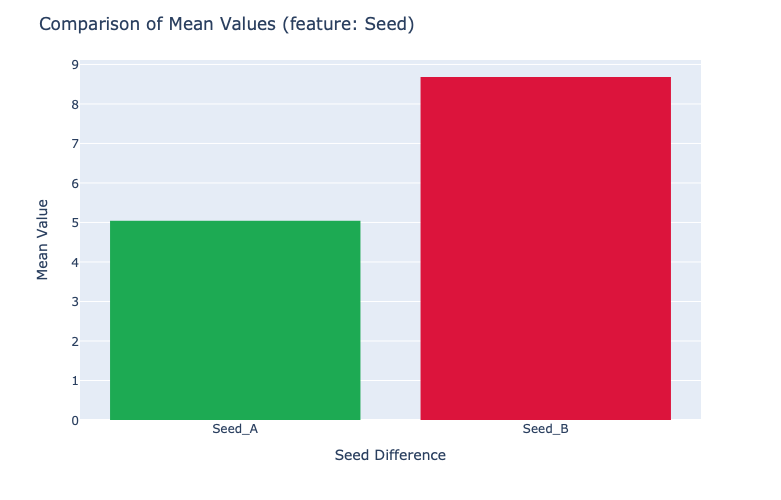

In [85]:
plot_featureAvsB(winning_data, 'Seed')

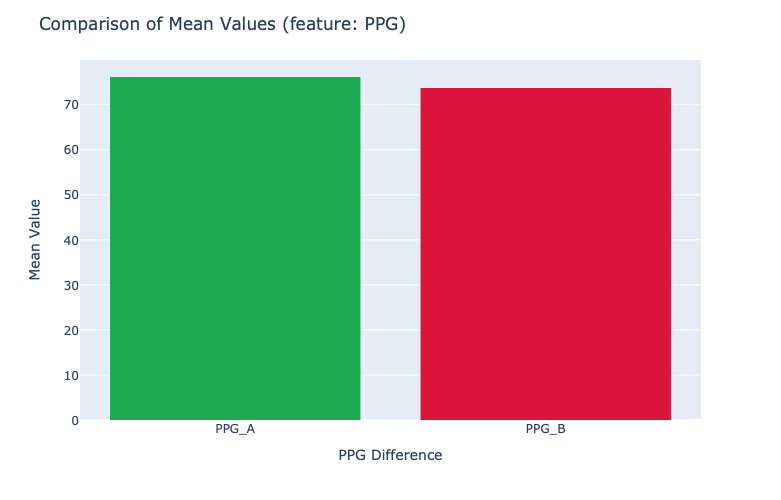

In [86]:
plot_featureAvsB(winning_data, 'PPG')

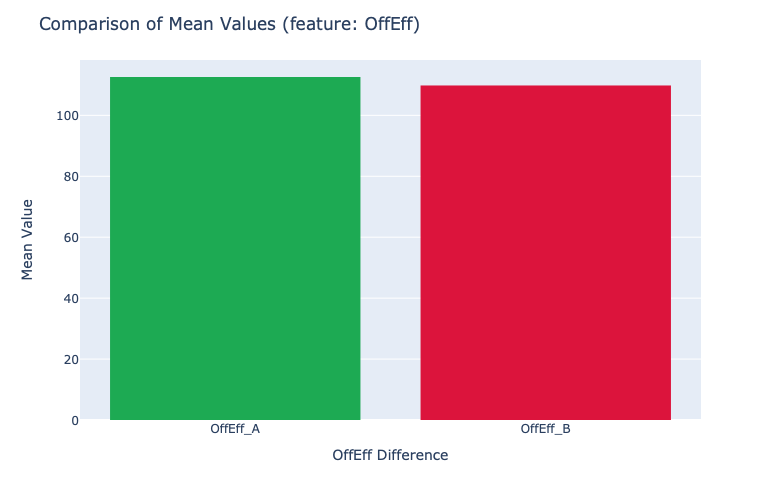

In [87]:
plot_featureAvsB(winning_data, 'OffEff')

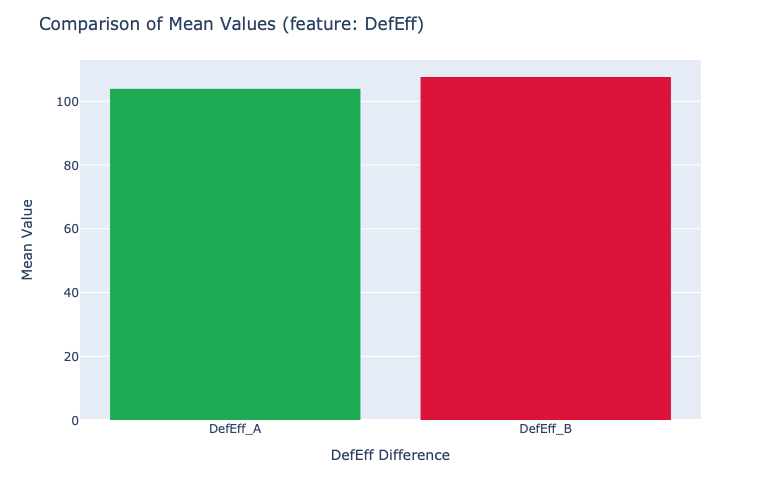

In [88]:
plot_featureAvsB(winning_data, 'DefEff')

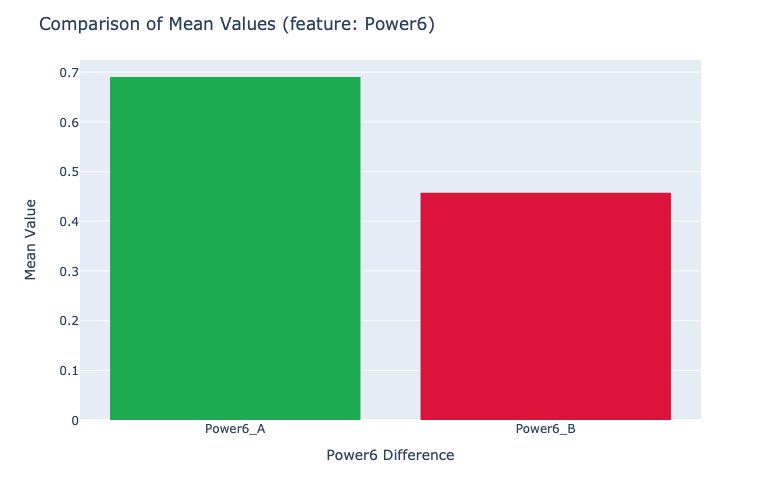

In [89]:
plot_featureAvsB(winning_data, 'Power6')

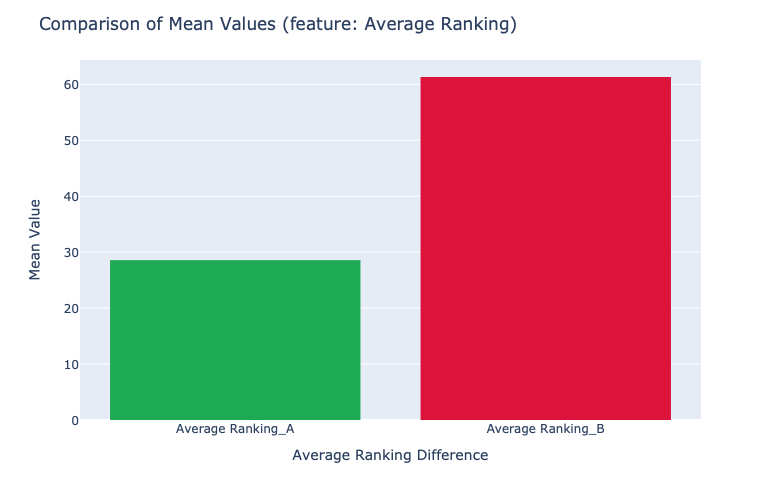

In [90]:
plot_featureAvsB(winning_data, 'Average Ranking')

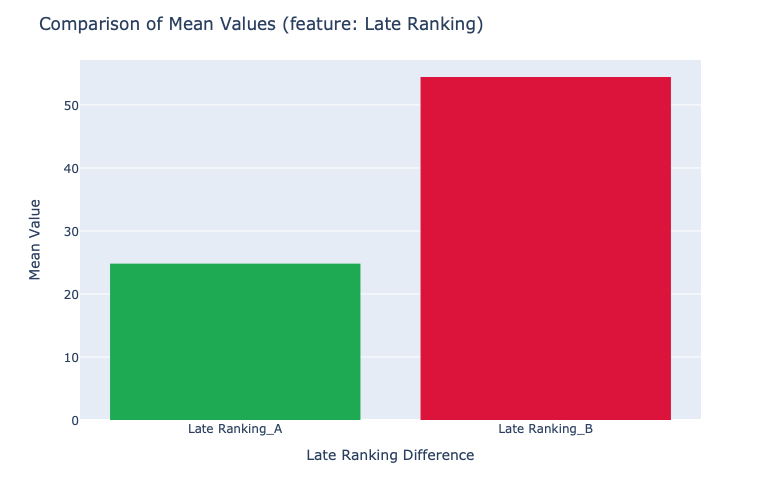

In [91]:
plot_featureAvsB(winning_data, 'Late Ranking')

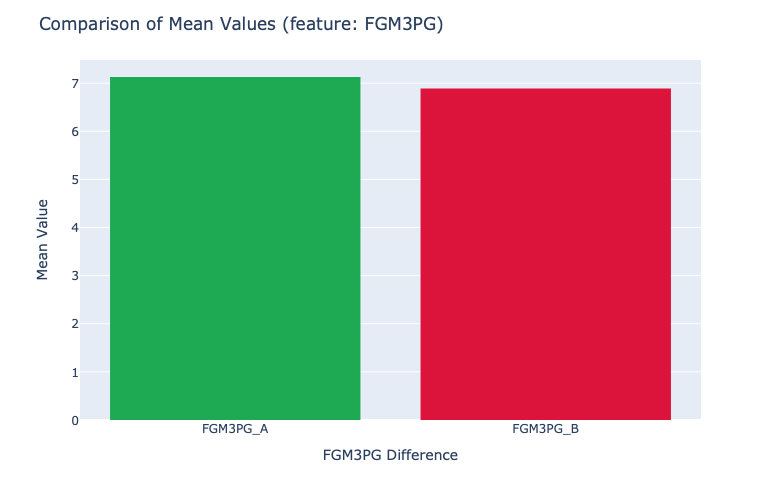

In [92]:
plot_featureAvsB(winning_data, 'FGM3PG')

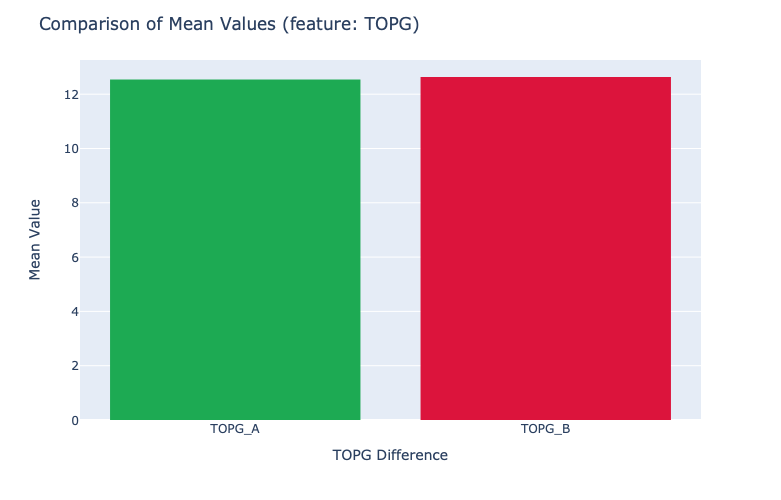

In [93]:
plot_featureAvsB(winning_data, 'TOPG')

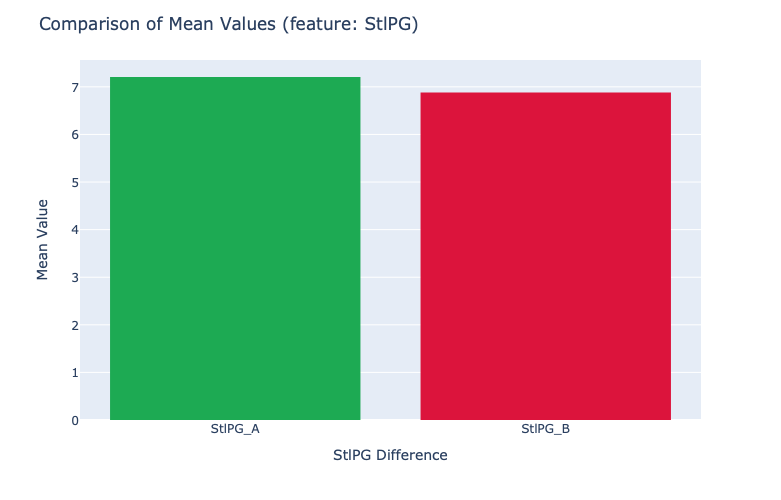

In [94]:
plot_featureAvsB(winning_data, 'StlPG')

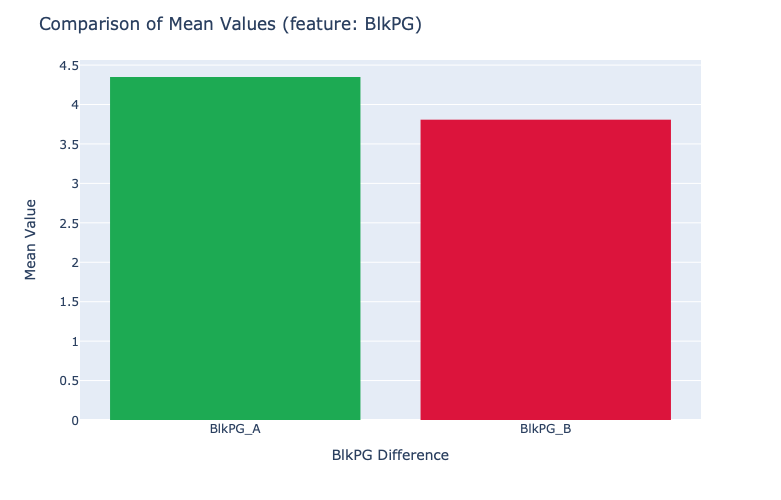

In [95]:
plot_featureAvsB(winning_data, 'BlkPG')

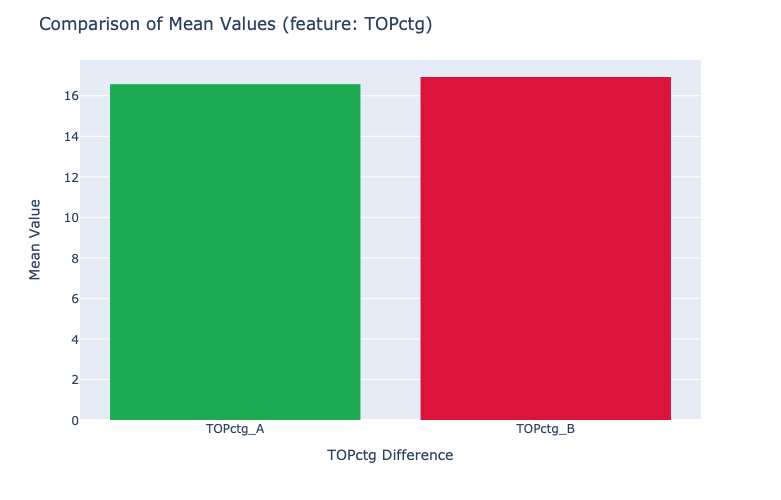

In [96]:

plot_featureAvsB(winning_data, 'TOPctg')

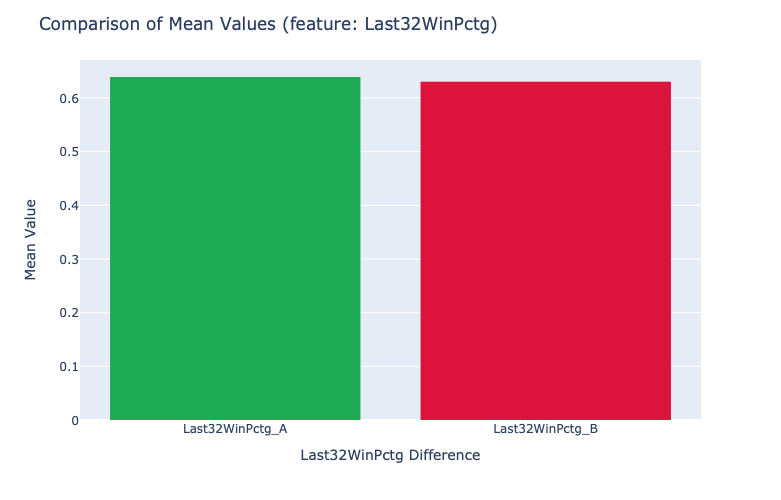

In [97]:
plot_featureAvsB(winning_data, 'Last32WinPctg')

__A Few Noticeable Trends:__  
- winning teams tend to be higher seeds as expected
- there are more winning teams that are from power6 conferences than losing teams
- winning teams have higher rankings than losing teams (this might be too similar of a feature to seed though)
- otherwise the stats such as PPG, OFFensive efficiency, etc. don't tend to 

__Distribution Plots:__

In [98]:
avg_stats_2 = avg_stats.drop(['Season','TeamID'], axis=1)
adv_stats_2 = adv_stats.drop(['Season','TeamID'], axis=1)
avg_stats_2.head()

,PPG,APG,ORPG,DRPG,FGAPG,FGMPG,FGA3PG,FGM3PG,FTAPG,FTMPG,StlPG,BlkPG,TOPG,FlsPG
0,57.250000,13.000000,4.178571,16.821429,39.785714,19.142857,20.821429,7.821429,17.107143,11.142857,5.964286,1.785714,11.428571,18.750000
1,78.777778,15.222222,9.777778,19.925926,55.851852,27.148148,16.074074,5.444444,25.851852,19.037037,7.259259,2.333333,12.629630,19.851852
2,69.285714,12.107143,13.571429,23.928571,57.178571,24.035714,19.857143,6.357143,20.928571,14.857143,6.607143,3.785714,13.285714,18.035714
3,71.769231,14.538462,13.500000,23.115385,61.615385,24.384615,20.769231,7.576923,21.846154,15.423077,9.307692,2.076923,18.653846,20.230769
4,63.607143,11.678571,12.285714,23.857143,55.285714,23.428571,17.642857,6.107143,16.464286,10.642857,8.357143,3.142857,17.035714,18.178571


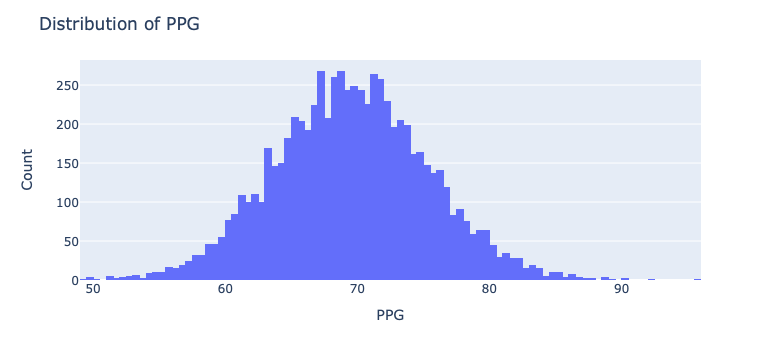

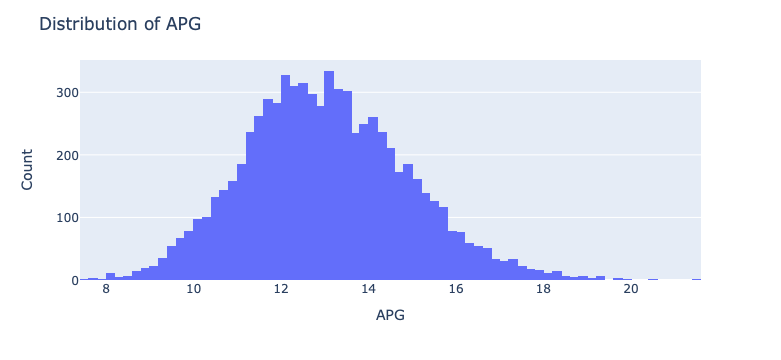

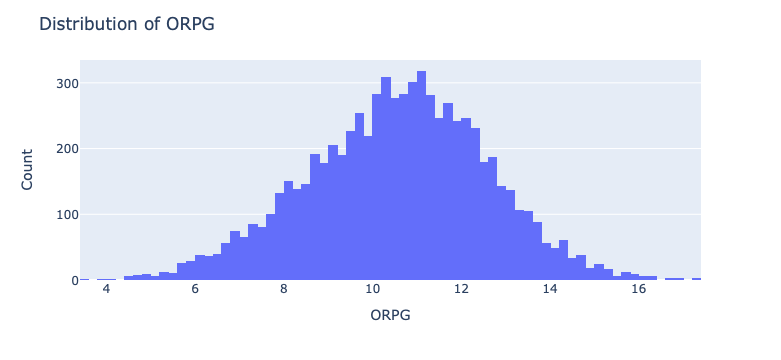

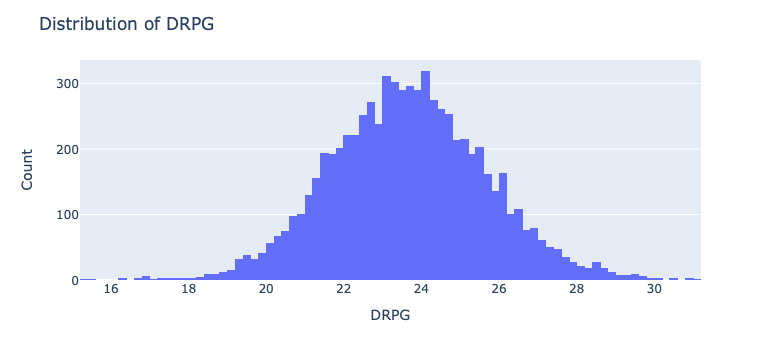

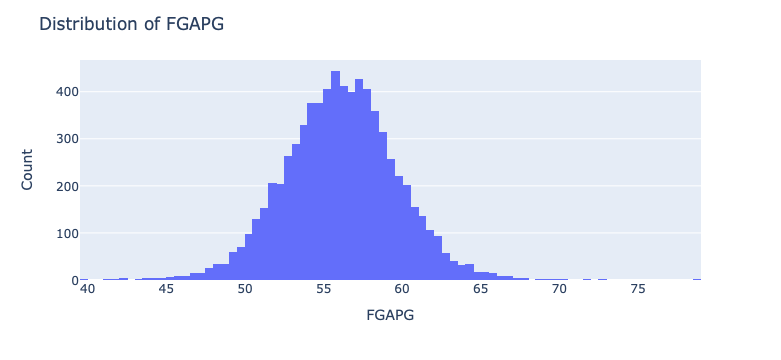

...

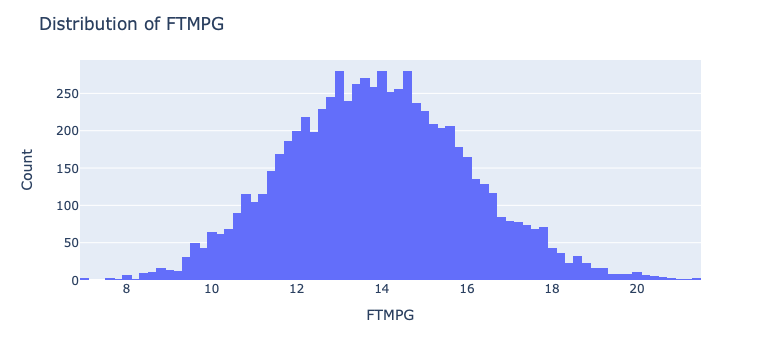

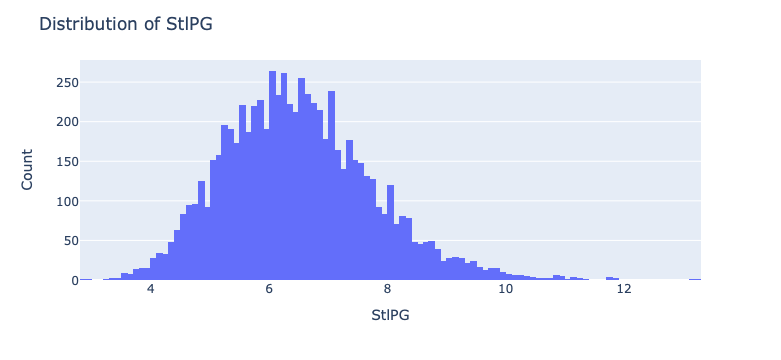

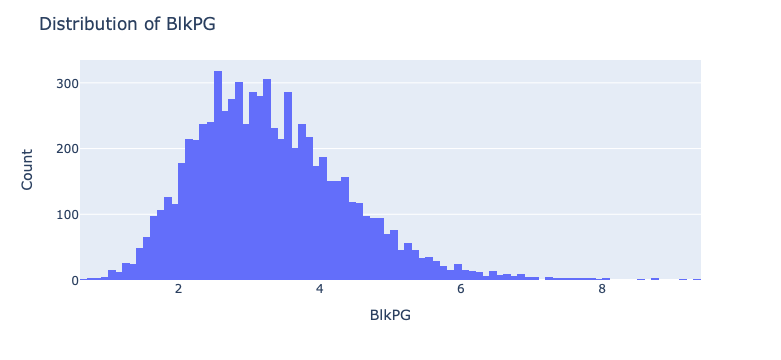

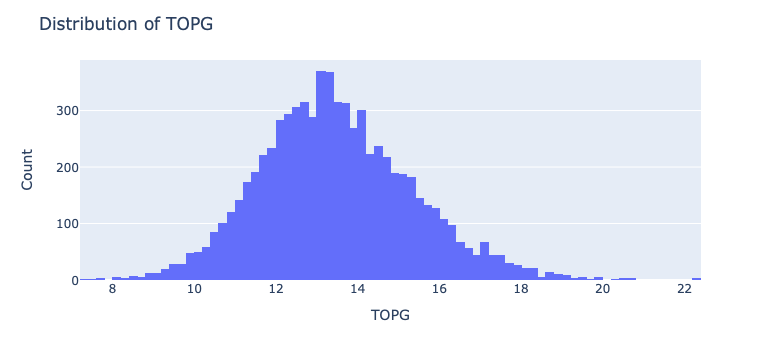

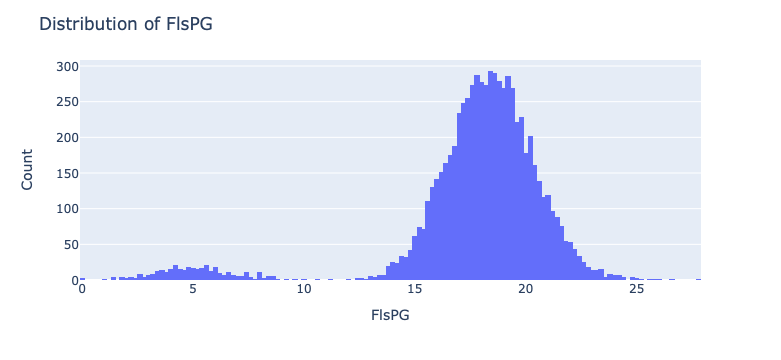

In [99]:
def create_distribution_plots(data):
    # Iterate through each feature in the dataset
    for feature in data.columns:
        # Create a distribution plot for the current feature
        fig = px.histogram(data, x=feature)

        # Customize the plot
        fig.update_layout(
            title=f"Distribution of {feature}",
            xaxis_title=feature,
            yaxis_title="Count",
        )

        # Show the plot
        fig.show()

create_distribution_plots(avg_stats_2)

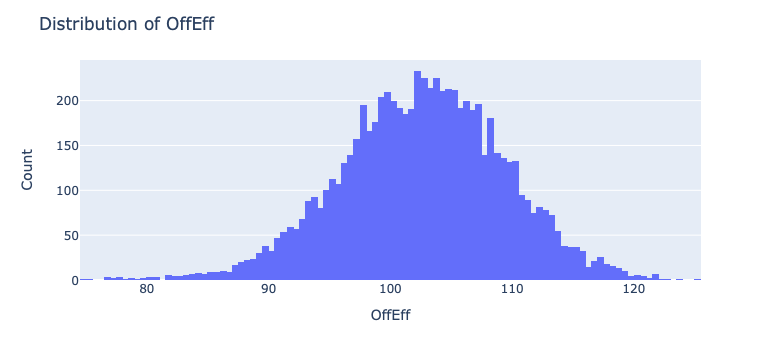

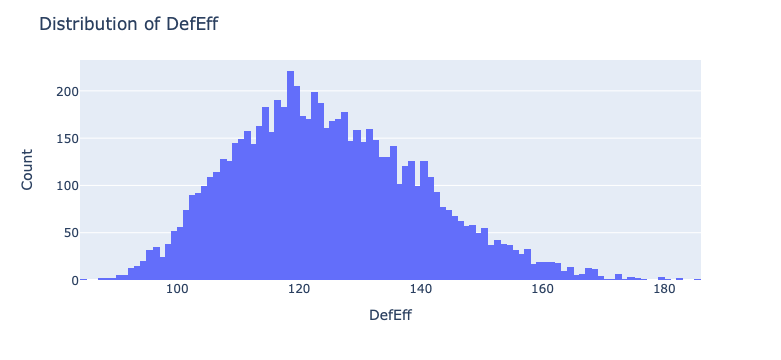

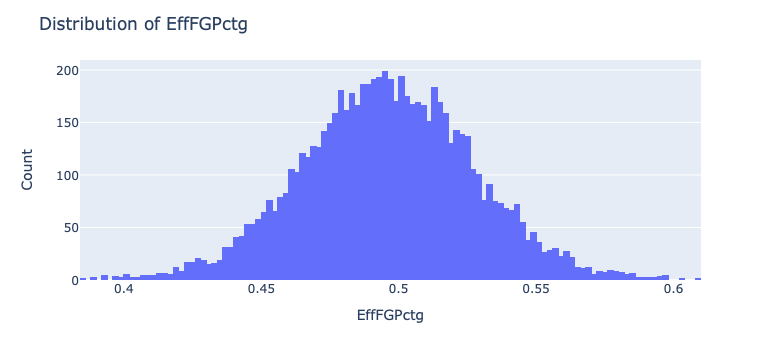

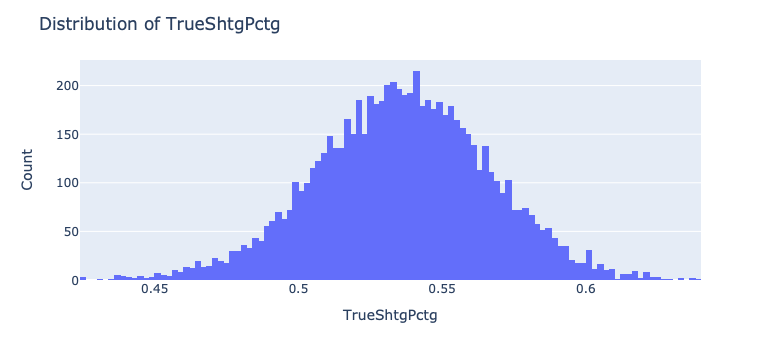

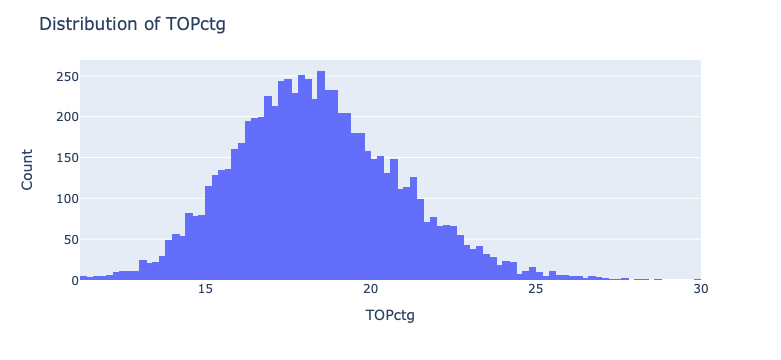

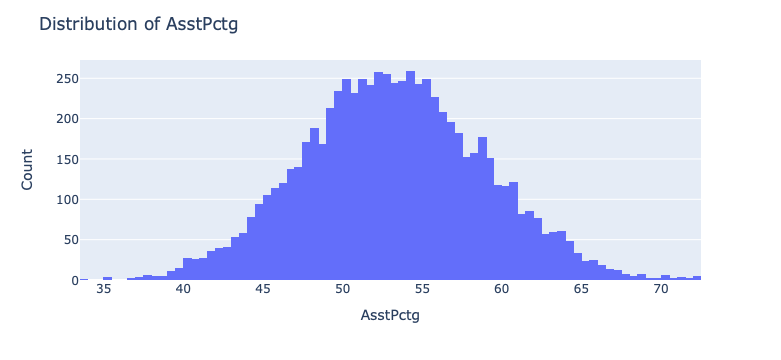

In [100]:
create_distribution_plots(adv_stats_2)

__Features that might make sense to deal with outliers:__  
- Assist Percentage
- True Shooting Percentage
- Effective Shooting Percentage
- Defensive and Offensive Efficiency

__Additional Notes:__   
- Every feature follows a normal distribution so we can normalize features
- Features not to normalize might be: ranking, seed, power6 

Dataset to use is Targets[13] (avg stats, adv stats, seeds, rankings, conference).   
Also use targets[13] but reduce dimensionality by subtracting teams B's stats from team A's.

In [101]:
# print columns of dataframe we will be testing
targets[13][0].columns

Index(['Season', 'Team A', 'Team B', 'WinTeamA', 'ScoreDiff', 'PPG_A', 'APG_A',
       'ORPG_A', 'DRPG_A', 'FGAPG_A', 'FGMPG_A', 'FGA3PG_A', 'FGM3PG_A',
       'FTAPG_A', 'FTMPG_A', 'StlPG_A', 'BlkPG_A', 'TOPG_A', 'FlsPG_A',
       'PPG_B', 'APG_B', 'ORPG_B', 'DRPG_B', 'FGAPG_B', 'FGMPG_B', 'FGA3PG_B',
       'FGM3PG_B', 'FTAPG_B', 'FTMPG_B', 'StlPG_B', 'BlkPG_B', 'TOPG_B',
       'FlsPG_B', 'Power6_A', 'Power6_B', 'Seed_A', 'Seed_B',
       'Last32WinPctg_A', 'Last14WinPctg_A', 'Last32WinPctg_B',
       'Last14WinPctg_B', 'Average Ranking_A', 'Early Ranking_A',
       'Median Ranking_A', 'Late Ranking_A',
       'Ranking improvement Median - Early_A',
       'Ranking improvement Late - Median_A',
       'Ranking improvement Late - Early_A', 'Average Ranking_B',
       'Early Ranking_B', 'Median Ranking_B', 'Late Ranking_B',
       'Ranking improvement Median - Early_B',
       'Ranking improvement Late - Median_B',
       'Ranking improvement Late - Early_B', 'OffEff_A', 'DefEff_A',
 

__Feature Reduction:__

In [102]:
# dataframe we will be using 
main_df = targets[13][0]

In [103]:
# based off the plots above and our knowledge of college basketball and data redundancy
# we're dropping the following columns
# last 14 win percentage only really considered a maximum of 3-5 games (so it doesn't tell us much) and many teams only had 
# 1-2 games in the final 14 days of the season
# remove ranking improvement (median-early) because we have three different ranking improvements (median-early, late-early, late-median)
# ranking already is very similar feature to seed, so remove median ranking and early ranking because we have late-ranking and average ranking
columns_to_drop = ['Last14WinPctg_A', 'Last14WinPctg_B', 'Ranking improvement Median - Early_A', 'Ranking improvement Median - Early_B','Late Ranking_B',
                   'Late Ranking_A','Early Ranking_A','Early Ranking_B','Median Ranking_A','Median Ranking_B']
main_df = main_df.drop(columns_to_drop, axis=1)
    

In [104]:
# REMOVE TEAM IDS AND SEASON FROM DF & MAKE GAME ID 
main_df['GameID'] = main_df['Season'].astype(str) + '_' + main_df['Team A'].astype(str) + '_' + main_df['Team B'].astype(str)
main_df.set_index('GameID', inplace=True)
main_df.drop('Season', axis=1, inplace=True)
main_df.drop('Team A', axis=1, inplace=True)
main_df.drop('Team B', axis=1, inplace=True)
main_df.drop('ScoreDiff', axis=1, inplace=True)

In [105]:
main_df.head()

,WinTeamA,PPG_A,APG_A,ORPG_A,DRPG_A,FGAPG_A,FGMPG_A,FGA3PG_A,FGM3PG_A,FTAPG_A,...,EffFGPctg_A,TrueShtgPctg_A,TOPctg_A,AsstPctg_A,OffEff_B,DefEff_B,EffFGPctg_B,TrueShtgPctg_B,TOPctg_B,AsstPctg_B
GameID,,,,,,,,,,,,,,,,,,,,,
2003_1411_1421,0,72.800000,14.200000,13.166667,24.800000,55.266667,24.733333,18.500000,5.933333,28.066667,...,0.501206,0.538334,20.152755,57.412399,101.820441,135.937761,0.486339,0.539424,21.005023,53.465347
2003_1112_1436,1,85.214286,17.642857,15.178571,27.642857,65.714286,30.321429,20.071429,7.035714,25.000000,...,0.514946,0.555400,16.963320,58.186101,103.393146,108.798992,0.491667,0.525815,19.012824,57.222222
2003_1113_1272,1,75.965517,15.551724,13.689655,23.310345,56.896552,27.206897,12.586207,4.000000,26.206897,...,0.513333,0.555080,18.389347,57.160963,106.760335,102.172982,0.496264,0.531700,17.157073,63.254593
2003_1141_1166,1,79.344828,15.620690,10.586207,23.275862,52.689655,26.620690,17.931034,6.827586,25.172414,...,0.570026,0.622161,23.399625,58.678756,115.257136,97.428225,0.568829,0.597895,17.348271,58.606125
2003_1143_1301,1,74.482759,16.000000,11.241379,24.379310,58.724138,27.344828,17.034483,6.413793,19.517241,...,0.520258,0.553267,18.252713,58.511980,108.374581,119.594785,0.530937,0.580699,19.624463,60.273973


In [106]:
main_df.columns

Index(['WinTeamA', 'PPG_A', 'APG_A', 'ORPG_A', 'DRPG_A', 'FGAPG_A', 'FGMPG_A',
       'FGA3PG_A', 'FGM3PG_A', 'FTAPG_A', 'FTMPG_A', 'StlPG_A', 'BlkPG_A',
       'TOPG_A', 'FlsPG_A', 'PPG_B', 'APG_B', 'ORPG_B', 'DRPG_B', 'FGAPG_B',
       'FGMPG_B', 'FGA3PG_B', 'FGM3PG_B', 'FTAPG_B', 'FTMPG_B', 'StlPG_B',
       'BlkPG_B', 'TOPG_B', 'FlsPG_B', 'Power6_A', 'Power6_B', 'Seed_A',
       'Seed_B', 'Last32WinPctg_A', 'Last32WinPctg_B', 'Average Ranking_A',
       'Ranking improvement Late - Median_A',
       'Ranking improvement Late - Early_A', 'Average Ranking_B',
       'Ranking improvement Late - Median_B',
       'Ranking improvement Late - Early_B', 'OffEff_A', 'DefEff_A',
       'EffFGPctg_A', 'TrueShtgPctg_A', 'TOPctg_A', 'AsstPctg_A', 'OffEff_B',
       'DefEff_B', 'EffFGPctg_B', 'TrueShtgPctg_B', 'TOPctg_B', 'AsstPctg_B'],
      dtype='object')

In [167]:
from sklearn.feature_selection import SelectKBest, chi2, RFECV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import *
from sklearn.linear_model import *
from sklearn.model_selection import *
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor


In [108]:
# check dtypes of every column to confirm only numerical
columns = main_df.columns
columns_dtypes = []
for i in columns:
    columns_dtypes.append(main_df[i].dtype)

print(columns_dtypes)

[dtype('int64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('int64'), dtype('int64'), dtype('int64'), dtype('int64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64'), dtype('float64')]


In [154]:
def scale_data(X):
    # Normalize / Scale using Standard Scaler X
    scaler = StandardScaler() #instantiate scaler
    X = scaler.fit_transform(X) #apply scaler to X
    return X
    

In [155]:
# create X and y
X = main_df.drop('WinTeamA', axis=1)
y = main_df['WinTeamA']

# Normalize / Scale using scale_data function
X = scale_data(X) #apply scaler to X

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12)

In [140]:
models = [Lasso(alpha=0.1), RandomForestRegressor(), LinearRegression()]

In [181]:
# Need to edit this function below so it trains the model in k-subsets using cross-validation
# currently it is only splitting the testing data into folds
# https://towardsdatascience.com/train-test-split-and-cross-validation-in-python-80b61beca4b6

In [145]:
def train_cv_test(X_train, X_test, y_train, y_test, models, model_number):
    # Create the Ridge regression model with L2 regularization
    model = models[model_number]

    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)
    y_test_predicted_binary = (y_pred > 0.5).astype(int) # convert predicted to 0 or 1 so we can get an accuracy score

    # Evaluate the model's performance
    print("Mean squared error:", mean_squared_error(y_test, y_test_predicted_binary))
    
    # Perform k-fold cross-validation
    scores = cross_val_score(model, X, y, cv=8)

    # Evaluate the cross-validation results
    print(f"Average cross-validation score: {scores.mean()}")
    
    # Calculate testing data accuracy using accuracy_score 
    accuracy_testing = accuracy_score(y_test, y_test_predicted_binary)
    print(f"Accuracy score on Testing data: {accuracy_testing}")
    return model

In [163]:
# initial model (linear regression) scores (Before feature selection/reduction & hyper-parameter tuning)
train_cv_test(X_train, X_test, y_train, y_test, models, 1)

Mean squared error: 0.3459915611814346
Average cross-validation score: 0.18936250915241137
Accuracy score on Testing data: 0.6540084388185654


RandomForestRegressor()

In [146]:
# Feature Importance:
# Selecting the best features using a RandomForest Regression Model
# based on mean decrease impurity (MDI or Gini index) across all splits where a feature is used

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor

# Train a random forest regressor
model = train_cv_test(X_train, X_test, y_train, y_test, models, 1)

# Select features based on mean decrease impurity
selector = SelectFromModel(model, prefit=True)
selected_features = selector.get_support()

# Reduce the dataset to only selected features
X_reduced = X[:, selected_features]


Mean squared error: 0.33755274261603374
Average cross-validation score: 0.18002257373838626
Accuracy score on Testing data: 0.6624472573839663


In [153]:
# Get the selected features after doing Feature Importance (MDI) ^ above
X = main_df.drop('WinTeamA', axis=1)
selected_feature_names = X.columns[selected_features]

print(selected_feature_names)

Index(['StlPG_A', 'BlkPG_A', 'FTMPG_B', 'Seed_A', 'Seed_B',
       'Average Ranking_A', 'Average Ranking_B',
       'Ranking improvement Late - Median_B', 'DefEff_A', 'DefEff_B'],
      dtype='object')


In [161]:
# Test models on reduced dataset

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=12)

model = train_cv_test(X_train, X_test, y_train, y_test, models, 2)

Mean squared error: 0.29535864978902954
Average cross-validation score: 0.15597877095083054
Accuracy score on Testing data: 0.7046413502109705


In [180]:
# Feature Reduction by removing features with low variance using Variance Threshold and KBest
from sklearn.feature_selection import VarianceThreshold, SelectKBest
from sklearn.feature_selection import f_regression

# Remove features with low variance
selector = VarianceThreshold(threshold=10)
selected_features = selector.fit_transform(X, y)
variance_selected_features = selector.get_support()  # Extract selected feature indices

# Select top K features based on F-statistic
selector = SelectKBest(f_regression, k=10)
selected_features = selector.fit_transform(X, y)
f_regression_selected_features = selector.get_support()  # Extract selected feature indices

# Combine selected feature indices from both methods
combined_selected_features = variance_selected_features | f_regression_selected_features  # Logical OR operation

# Map selected features to column names
X = main_df.drop('WinTeamA', axis=1)
selected_feature_names = X.columns[combined_selected_features]  # Extract column names
print(selected_feature_names)

Index(['PPG_A', 'FGAPG_A', 'FGMPG_A', 'FGA3PG_A', 'FlsPG_A', 'PPG_B',
       'FGAPG_B', 'FGA3PG_B', 'FlsPG_B', 'Power6_A', 'Power6_B', 'Seed_A',
       'Seed_B', 'Average Ranking_A', 'Ranking improvement Late - Median_A',
       'Ranking improvement Late - Early_A', 'Average Ranking_B',
       'Ranking improvement Late - Median_B',
       'Ranking improvement Late - Early_B', 'OffEff_A', 'DefEff_A',
       'AsstPctg_A', 'OffEff_B', 'DefEff_B', 'AsstPctg_B'],
      dtype='object')


In [ ]:
# same dataset but the features are the difference in teamA's stat and teamB's stat
# for example: ppg_diff = teamA_PPG - teamB_PPG

main_df_meno = pd.DataFrame({
    'WinTeamA': main_df['WinTeamA'],
    'ppg_diff': main_df['PPG_A'] - main_df['PPG_B'],
    'apg_diff': main_df['APG_A'] - main_df['APG_B'],
    'orpg_diff': main_df['ORPG_A'] - main_df['ORPG_B'],
    'drpg_diff': main_df['DRPG_A'] - main_df['DRPG_B'],
    'fgapg_diff': main_df['FGAPG_A'] - main_df['FGAPG_B'],
    'fgmpg_diff': main_df['FGMPG_A'] - main_df['FGMPG_B'],
    'fga3pg_diff': main_df['FGA3PG_A'] - main_df['FGA3PG_B'],
    'fgm3pg_diff': main_df['FGM3PG_A'] - main_df['FGM3PG_B'],
    'ftapg_diff': main_df['FTAPG_A'] - main_df['FTAPG_B'],
    'ftmpg_diff': main_df['FTMPG_A'] - main_df['FTMPG_B'],
    'stlpg_diff': main_df['StlPG_A'] - main_df['StlPG_B'],
    'blkpg_diff': main_df['BlkPG_A'] - main_df['BlkPG_B'],
    'topg_diff': main_df['TOPG_A'] - main_df['TOPG_B'],
    'flspg_diff': main_df['FlsPG_A'] - main_df['FlsPG_B'],
    'power6_diff': main_df['Power6_A'] - main_df['Power6_B'],
    'seed_diff': main_df['Seed_A'] - main_df['Seed_B'],
    'last32winpctg_diff': main_df['Last32WinPctg_A'] - main_df['Last32WinPctg_B'],
    'avgrnkg_diff': main_df['Average Ranking_A'] - main_df['Average Ranking_B'],
    'rnkgImp(L-M)_diff': main_df['Ranking improvement Late - Median_A'] - main_df['Ranking improvement Late - Median_B'],
    'rnkgImp(L-E)_diff': main_df['Ranking improvement Late - Early_A'] - main_df['Ranking improvement Late - Early_B'],
    'offEff_diff': main_df['OffEff_A'] - main_df['OffEff_B'],
    'defEff_diff': main_df['DefEff_A'] - main_df['DefEff_B'],
    'effFgPctg_diff': main_df['EffFGPctg_A'] - main_df['EffFGPctg_B'],
    'trShtgPctg_diff': main_df['TrueShtgPctg_A'] - main_df['TrueShtgPctg_A'],
    'TOPctg_diff': main_df['TOPctg_A'] - main_df['TOPctg_B'],
    'AsstPctg_diff': main_df['AsstPctg_A'] - main_df['AsstPctg_B'],
    # Add similar calculations for other columns
})

In [ ]:
main_df_meno.head()